In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import torch
from torch import nn
from torch.utils.data import  DataLoader,SubsetRandomSampler 
import torch.optim as optim # Optimization package
from sklearn.model_selection import KFold
from sklearn.utils import shuffle
from scipy import stats  as stat
from imblearn.combine import SMOTEENN

# Helper functions for model training

In [4]:
def see_data_stored(data_from_customDataFunction):
  x = print('\nFirst iteration of data set: ', next(iter(data_from_customDataFunction)), '\n') # Display text and label.
  y =print('Length of data set: ', len(data_from_customDataFunction), '\n')                  # Print how many items are in the data set
  #z = print('Entire data set: ', list(DataLoader(data_from_customDataFunction)), '\n')        # Print entire data set
  return x,y

### Prepare data

<p> LOAD LALONDE DATASET </p>

In [5]:
'''
Load the two datasets.
nsw = Male sub sample of treated and control units as used by Lalonde.
nswre74  = Further subsample extracted by Dehejia and Wahba (1999) which includes information on earnings in 1974 (re74)
'''

# RCT's 
nsw = pd.read_csv("/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/nsw_featureTransformed.csv")
nswre74 = pd.read_csv("/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/nswre74_featureTransformed.csv")

# Quasi data 
nswCps_lalonde =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_lalonde.csv')
nswPsid_lalonde = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_lalonde.csv')
nswCps_dehWab =   pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_dehWab.csv')
nswPsid_dehWab =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_dehWab.csv')



In [6]:
nsw

,treat,age,education,black,hispanic,married,nodegree,re75,re78,u75,...,black_u75,ageboxcox,agesq,re78boxcox,re75boxcox,lnre78,lnre75,re78sq,re75sq,educsq
0,1,37,11,1,0,1,1,0,9930,1,...,1,0.776626,1369,30.036761,0.000000,9.203316,0.000000,98604900,1,121
1,1,22,9,0,1,0,1,0,3595,1,...,0,0.769235,484,23.089404,0.000000,8.187299,0.000000,12924025,1,81
2,1,30,12,1,0,0,0,0,24909,1,...,1,0.774216,900,37.821001,0.000000,10.122984,0.000000,620458281,1,144
3,1,27,11,1,0,0,1,0,7506,1,...,1,0.772740,729,27.965099,0.000000,8.923458,0.000000,56340036,1,121
4,1,33,8,1,0,0,1,0,289,1,...,1,0.775391,1089,11.298866,0.000000,5.666427,0.000000,83521,1,64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
666,0,20,10,1,0,0,1,825,0,0,...,0,0.767264,400,0.000000,9.152060,0.000000,6.715383,1,680625,100
667,0,17,9,0,1,0,1,0,5114,1,...,0,0.763299,289,25.324915,0.000000,8.539737,0.000000,26152996,1,81
668,0,17,9,1,0,0,1,1206,0,0,...,0,0.763299,289,0.000000,9.848704,0.000000,7.095064,1,1454436,81
669,0,19,11,1,0,0,1,0,0,1,...,1,0.766100,361,0.000000,0.000000,0.000000,0.000000,1,1,121


<P> LOAD SIMULATED DATASET</P>

In [7]:
simulated_dataset = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/simulated_experimental_dataset.csv')
simulated_dataset.drop('Unnamed: 0', axis=1, inplace=True)

#### Data pre-processing for NN 

In [8]:
from sklearn.preprocessing import StandardScaler

def data_cleaning_function(dataset):
    """
    Function to clean the lalond dasets.
    
    """
    
    dataset = shuffle(dataset).reset_index(drop=True) # shuffle data 
    dataset.rename(columns={'education*': 'education'}, inplace=True)

    sc = StandardScaler()
    covariate_subset1 = ['treat','ageboxcox','education','black','hispanic','married','nodegree','lnre75']
    covariate_subset2 = ['treat','ageboxcox','education','black','hispanic','married','nodegree','lnre74','lnre75']
    continous_variables1 = ['ageboxcox','education','lnre75'] 
    continous_variables2 = ['ageboxcox','education','lnre74','lnre75'] 
    
    if 're74' in dataset.columns:
        dataset= dataset[covariate_subset2]
        dataset[continous_variables2] = sc.fit_transform(dataset[continous_variables2]) # scale continuos variables
    else:
        dataset= dataset[covariate_subset1]    
        dataset[continous_variables1] = sc.fit_transform(dataset[continous_variables1]) # scale continuos variables
     
    return dataset 


In [9]:
def features_and_targets_function(dataset,upsample):

    """
    Split dataset into features and targets 
    
    """
    features = dataset.drop('treat', axis=1) # Drop treated units 
    target = dataset.iloc[:,0] # target column
    features_as_array = np.array(features)
    target_as_array = np.array(target)
    upsample = upsample
    if upsample == True:
        resample=SMOTEENN(random_state=0) # resampling
        features_as_array, target_as_array = resample.fit_resample(features_as_array, target_as_array)
    else:
        pass 

    features_as_tensor = torch.tensor(features_as_array)
    target_as_tensor = torch.tensor(target_as_array).unsqueeze(1)
    shape = features_as_tensor.shape[1]

    return features_as_tensor, target_as_tensor,shape; 

In [10]:
from sklearn.model_selection import train_test_split

def train_test_split_upsampled(dataset):

    train_dataset, test_dataset = train_test_split(dataset,  test_size=0.3, random_state=0)

    X_train, y_train,shape_features_train = features_and_targets_function(train_dataset,False)

    X_test, y_test,shape_features_test = features_and_targets_function(train_dataset,True)

    return X_train,y_train,X_test,y_test,shape_features_train;
    

#### Pytorch : custom class for datasets

In [11]:
class CustomDataset:
  def __init__(self,features,target):    
    
    #import features and targets  
    self.features = features              
    self.target = target               
  
  def __len__(self):
    """
    Returns length of the dataset.
    """
    return len(self.features)

  def __getitem__(self,idx):
    """
    Returns features and target with index idx.
    """
    features = self.features[idx]
    target = self.target[idx]    
    return (features, target)

#### construct neural netowrk

### Model 

In [12]:
# Define neural netowork class 
class threelayerNN(nn.Module):
    def __init__(self, num_features, num_classes, num_hidden_1, num_hidden_2,num_hidden_3,num_hidden_4,num_hidden_5):
        super(threelayerNN, self).__init__() 
       
        self.input_layer =  nn.Linear(num_features,num_hidden_1)                        
        self.hidden_layer1 = nn.Linear(num_hidden_1,num_hidden_2)                          
        self.hidden_layer2 =  nn.Linear(num_hidden_2, num_hidden_3) 
        self.hidden_layer3 =  nn.Linear(num_hidden_3, num_hidden_4) 
        self.hidden_layer4 =  nn.Linear(num_hidden_4, num_hidden_5)
        self.hidden_layer5 =  nn.Linear(num_hidden_5, num_classes) 
    
        # Activation functions
        self.relu_activation = nn.ReLU()    
        self.output_activation = nn.Sigmoid()
        #Drop out and batch normalisation 
        self.dropout = nn.Dropout(p=0.3)
        self.batchnorm1 = nn.BatchNorm1d(num_hidden_1)
        self.batchnorm2 = nn.BatchNorm1d(num_hidden_2)
        self.batchnorm3 = nn.BatchNorm1d(num_hidden_3)
        self.batchnorm4 = nn.BatchNorm1d(num_hidden_4)
        self.batchnorm5 = nn.BatchNorm1d(num_hidden_5)
    
    # Forward propogation method
    def forward(self, x):
        # input 
        x = self.input_layer(x)
        x = self.relu_activation(x)
        x = self.batchnorm1(x)
        x = self.dropout(x)
        # first hidden layer
        x = self.hidden_layer1(x)
        x = self.relu_activation(x)
        x = self.batchnorm2(x)
        x = self.dropout(x)
        # second hidden layer and output
        x = self.hidden_layer2(x)
        x = self.relu_activation(x)
        x = self.batchnorm3(x)
        x = self.dropout(x)
        x = self.hidden_layer3(x)
        x = self.relu_activation(x)
        x = self.batchnorm4(x)
        x = self.dropout(x)
        x = self.hidden_layer4(x)
        x = self.relu_activation(x)
        x = self.batchnorm5(x)
        x = self.dropout(x)
        x = self.hidden_layer5(x)
        x = self.output_activation(x)
        return x


class twoLayerNN(nn.Module):
    def __init__(self,num_features, num_classes, num_hidden_1, num_hidden_2):
        super(twoLayerNN, self).__init__() 
       
        self.input_layer =  nn.Linear(num_features,num_hidden_1)                        
        self.hidden_layer1 = nn.Linear(num_hidden_1,num_hidden_2)                          
        self.out_layer =  nn.Linear(num_hidden_2, num_classes) 

        # Activation functions
        self.relu_activation = nn.ReLU()    
        self.output_activation = nn.Sigmoid()
        #Drop out and batch normalisation 
        self.dropout = nn.Dropout(p=0.35)
        self.batchnorm1 = nn.BatchNorm1d(num_hidden_1)
        self.batchnorm2 = nn.BatchNorm1d(num_hidden_2)

    # Forward propogation method
    def forward(self, inputs):
        x = self.relu_activation(self.input_layer(inputs))
        x = self.batchnorm1(x)
        x = self.relu_activation(self.hidden_layer1(x))
        x = self.batchnorm2(x)
        x = self.dropout(x)
        x = self.output_activation(self.out_layer(x))
        return x

    def compute_l1_loss(self, w):
      return torch.abs(w).sum()

class ONELayerNN(nn.Module):
    def __init__(self,num_features, num_classes, num_hidden_1):
        super(ONELayerNN, self).__init__() 
       
        self.input_layer =  nn.Linear(num_features,num_hidden_1)                                               
        self.out_layer =  nn.Linear(num_hidden_1, num_classes) 

        # Activation functions
        self.relu_activation = nn.ReLU()    
        self.output_activation = nn.Sigmoid()
        #Drop out and batch normalisation 
        self.dropout = nn.Dropout(p=0.2)
        self.batchnorm1 = nn.BatchNorm1d(num_hidden_1)

    # Forward propogation method
    def forward(self, inputs):
        x = self.relu_activation(self.input_layer(inputs))
        x = self.batchnorm1(x)
        x = self.dropout(x)
        x = self.output_activation(self.out_layer(x))
        return x

    def compute_l1_loss(self, w):
      return torch.abs(w).sum()      

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


### NN helper functions 

In [13]:
# Function to reset model weights 
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    layer.reset_parameters()

# Function to initialise model weights 
def initialize_weights(m):
    classname = m.__class__.__name__  
    if classname.find('Linear') != -1:
     n = m.in_features
     y = 1.0/np.sqrt(n)
     m.weight.data.uniform_(-y, y)
     m.bias.data.fill_(0)
    

### Model training - Train, Test Split, no Kfold , with imbalanced dalaloader and upsampling

In [77]:
# Dictionaries to store results  
validation_accuracy_dict = {}      
validation_loss_dict = {}
training_accuracy_dict = {}
training_loss_dict = {}

train_precision_dict = {}
train_recall_dict = {}
train_f1_dict = {}
train_mse_dict = {}

test_precision_dict = {}
test_recall_dict = {}
test_f1_dict = {}
test_mse_dict = {}


foldperf = {}
acc_per_epoch = {}
fold_validation_accuracy = {}

In [78]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [79]:
def nn_ready_data_function(dataset):

   dataset = data_cleaning_function(dataset)

   X_train,y_train,X_test,y_test,shape =  train_test_split_upsampled(dataset)
 
   train_data = CustomDataset(features = X_train,target = y_train)
   test_data = CustomDataset(features = X_test,target = y_test)

   return train_data, test_data, shape; 

In [80]:
nsw = pd.read_csv("/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/nsw_featureTransformed.csv")
nswre74 = pd.read_csv("/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/nswre74_featureTransformed.csv")
nswCps_lalonde =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_lalonde.csv')
nswPsid_lalonde = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_lalonde.csv')
nswCps_dehWab =   pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_dehWab.csv')
nswPsid_dehWab =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_dehWab.csv')

In [81]:
# Subset dataset for ANN training 
train_data, test_data , shape = nn_ready_data_function(nswCps_lalonde)

In [82]:
NUM_FEATURES = shape
NUM_HIDDEN_1 = 12
NUM_HIDDEN_2 = 12
NUM_CLASSES = 1
NUM_EPOCHS = 200
BATCH_SIZE = 512
LEARNING_RATE = 0.0001
WEIGHT_DECAY = 0.0182

In [83]:
import sklearn.metrics as metrics

trainloader = DataLoader(train_data,  batch_size=BATCH_SIZE)
testloader = DataLoader(test_data,batch_size=BATCH_SIZE)

# Instanstiate model 

model = twoLayerNN(num_features = NUM_FEATURES,num_classes  = NUM_CLASSES, num_hidden_1 = NUM_HIDDEN_1,num_hidden_2 = NUM_HIDDEN_2)
model.to(device)
# Reset weights 
model.apply(reset_weights)
model.apply(initialize_weights)
#Initialise optimiser and loss function 
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE,weight_decay=WEIGHT_DECAY)
criterion = nn.BCEWithLogitsLoss()

metrics = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}


In [84]:
import warnings

# Functions for ANN training 
# def get loss each epoch 
def store_loss(loss,features,dataloader,running_loss,epoch,dataloader_id):
    if dataloader.__hash__() == dataloader_id:
        x = running_loss
        x += loss.item()*features.size(0)
        avg_loss = x / len(trainloader.sampler)
        training_loss_dict[(epoch)] = avg_loss
    else:
        x = running_loss
        x += loss.item()*features.size(0)
        avg_loss = x / len(trainloader.sampler)
        validation_loss_dict[(epoch)] = avg_loss


from sklearn import metrics

# def get metrics 
def store_metrics(pred,target,dataloader,epoch,dataloader_id):
    
    if dataloader.__hash__() == dataloader_id:
        # Precision
        precision = metrics.precision_score(target,pred)
        train_precision_dict[(epoch)] = precision
        # Recall
        recall = metrics.recall_score(target,pred)
        train_recall_dict[(epoch)] = recall
        # MSE 
        mse = metrics.mean_squared_error(target,pred)
        train_mse_dict[(epoch)] = mse
        # F1
        f1 = metrics.f1_score(target,pred)
        train_f1_dict[(epoch)] = f1
        warnings.filterwarnings('ignore')
    else:
        precision = metrics.precision_score(target,pred)
        test_precision_dict[(epoch)] = precision
        # Recall
        recall = metrics.recall_score(target,pred)
        test_recall_dict[(epoch)] = recall
        # MSE 
        mse = metrics.mean_squared_error(target,pred)
        test_mse_dict[(epoch)] = mse
        # F1
        f1 = metrics.f1_score(target,pred)
        test_f1_dict[(epoch)] = f1
        warnings.filterwarnings('ignore')



In [91]:
# Define train and test
def trainTestModel(train_loader, test_loader):
    
    model = twoLayerNN(num_features = NUM_FEATURES,num_classes  = NUM_CLASSES, num_hidden_1 = NUM_HIDDEN_1,num_hidden_2 = NUM_HIDDEN_2) 
    #model = ONELayerNN(num_features = NUM_FEATURES,num_classes  = NUM_CLASSES, num_hidden_1 = NUM_HIDDEN_1) 
    model.to(device)
    model.apply(initialize_weights)

    optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE,weight_decay=WEIGHT_DECAY)
    criterion = nn.BCEWithLogitsLoss()
    # train & test process
    def train(trainloader,epoch,accuracy,dataloader_id):
        model.train()
        correct = 0
        for batch_idx, (data, target) in enumerate(trainloader):
            data, target = data.float().to(device), target.float().to(device)
            optimizer.zero_grad()
            output = model(data)
            output = output
            target = target
            loss = criterion(output, target)
            store_loss(loss,data,trainloader,running_loss,epoch,dataloader_id) # loss for plotting
            pred = (output >= 0.5).type(torch.uint8)
            store_metrics(pred,target,trainloader,epoch,dataloader_id)
            correct += pred.eq(target.view_as(pred)).sum().item()   
            loss.backward()
            optimizer.step()

        train_acc = 100. * correct / len(trainloader.dataset)
        training_accuracy_dict[(epoch)] = train_acc
        #store_accuracy(pred,target,correct_store,trainloader,epoch,accuracy,dataloader_id) # accuracy for plotting

    def test(testloader,epoch,accuracy,dataloader_id):
        model.eval()
        correct = 0
        targets, preds = [], []
        with torch.no_grad():
            for data, target in test_loader:
                data, target = data.float().to(device), target.float().to(device)
                output = model(data)
                loss = criterion(output , target)
                store_loss(loss,data,test_loader,running_loss,epoch,dataloader_id) # loss for plotting
                pred = (output >= 0.5).type(torch.uint8) 
                print(pred)
                store_metrics(pred,target,testloader,epoch,dataloader_id)
                correct += pred.eq(target.view_as(pred)).sum().item()
                targets += list(target.cpu().numpy())
                preds += list(pred.cpu().numpy())
        
        #store_accuracy(pred,target,correct_store,trainloader,epoch,accuracy,dataloader_id) # accuracy for plotting  
        test_acc = 100. * correct / len(testloader.dataset)
        validation_accuracy_dict[(epoch)] = test_acc
        confusion_mtx = metrics.confusion_matrix(targets, preds)
        return test_acc, confusion_mtx
    
    test_accs, confusion_mtxes = [], []
    trainloader_id = train_loader.__hash__()    
    for epoch in range(1, NUM_EPOCHS + 1):
        running_loss = 0.0
        accuracy = 0
        train(train_loader,epoch,accuracy,trainloader_id)
        test_acc, confusion_mtx = test(test_loader,epoch,accuracy,trainloader_id)
        test_accs.append(test_acc)
        confusion_mtxes.append(confusion_mtx)
        print('\rBest test acc = %2.2f%%' % max(test_accs), end='', flush=True)
        
  

In [92]:
trainTestModel(train_loader=trainloader,test_loader=testloader)

tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [0],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [0],
        [0],
        [1],
        [0],
        [1],
        [1],
        [0],
        [1],
        [1],
        [1],
        [0],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [0],
        [1],
        [0],
        [1],
        [1],
        [1],
        [0],
        [1],
        [1],
        [0],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],

KeyboardInterrupt: 

In [87]:
# Create lists
train_accuracy_list = list(training_accuracy_dict.values())
test_accuracy_list = list(validation_accuracy_dict.values())

train_loss_list = list(training_loss_dict.values())
test_loss_list = list(validation_loss_dict.values())

train_precision_list = list(train_precision_dict.values()) 
train_recall_list = list(train_recall_dict.values()) 

train_f1_list = list(train_f1_dict.values())
train_mse_list = list(train_mse_dict.values())

test_precision_list = list(test_precision_dict.values()) 
test_recall_list = list(test_recall_dict.values()) 
test_f1_list = list(test_f1_dict.values())
test_mse_list = list(test_mse_dict.values())

In [88]:
len(train_accuracy_list)

200

In [89]:
print(f'avg train acc: {np.mean(train_accuracy_list):.2f} | 'f'avg test acc : {np.mean(test_accuracy_list):.2f} | '
      f'avg train prec : {np.mean(train_precision_list):.2f} |'f'avg test prec : {np.mean(test_precision_list):.2f} |'
      f' avg train mse: {np.mean(train_mse_list):.2f} | ' f'avg test mse: {np.mean(test_mse_list):.2f} |'
      f' avg train F1: {np.mean(train_f1_list):.2f} | 'f' avg test F1: {np.mean(test_f1_list):.2f}')

avg train acc: 96.92 | avg test acc : 58.39 | avg train prec : 0.39 |avg test prec : 0.54 | avg train mse: 0.02 | avg test mse: 0.79 | avg train F1: 0.40 |  avg test F1: 0.30


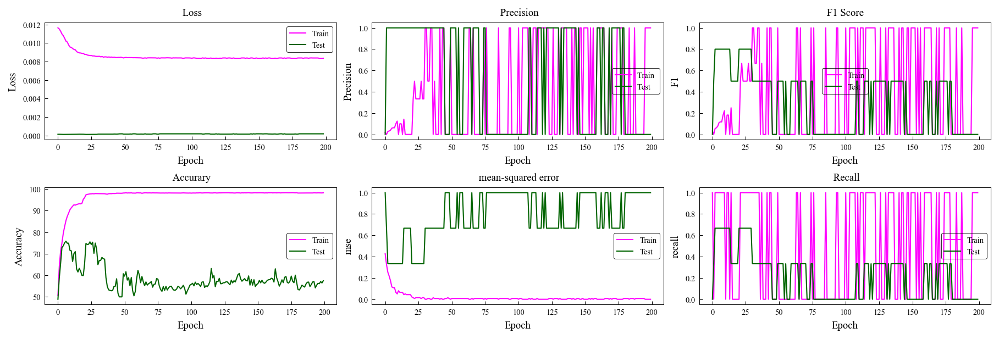

In [90]:
from tueplots import axes, bundles , figsizes, fonts,fontsizes
# Create plots of all metrics 

# Global plot settings 

fig, ax = plt.subplots(nrows=2, ncols=3,figsize=(12,4))
plt.rcParams.update({"figure.dpi": 150})
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(fonts.neurips2022())
plt.rcParams.update(axes.tick_direction( y="in",x = "in"))
plt.rcParams.update(axes.color(base="black"))
plt.rcParams.update(figsizes.neurips2022(nrows=2, ncols=3))
plt.rcParams.update(fontsizes.neurips2022())


#x-axis
xrange = range(0,NUM_EPOCHS+1)

# Loss
ax[0,0].plot(range(0,len(train_loss_list)-1), train_loss_list[:-1], label='Train',color='magenta')
ax[0,0].plot(range(0,len(test_loss_list)-1), test_loss_list[:-1], label='Test',color = 'darkgreen')
ax[0,0].legend()
ax[0,0].set_xlabel('Epoch')
ax[0,0].set_ylabel('Loss')
ax[0,0].set_title(' Loss')

# Precison 
ax[0,1].plot(range(0,len(train_precision_list)), train_precision_list, label='Train ',color='magenta')
ax[0,1].plot(range(0,len(test_precision_list)), test_precision_list, label='Test ',color = 'darkgreen')
ax[0,1].set_xlabel('Epoch')
ax[0,1].set_ylabel('Precision')
ax[0,1].set_title(' Loss')
ax[0,1].set_title(' Precision')
ax[0,1].legend()
# F1 
ax[0,2].plot(range(0,len(train_f1_list)), train_f1_list, label='Train',color='magenta')
ax[0,2].plot(range(0,len(test_f1_list)), test_f1_list, label='Test',color = 'darkgreen')
ax[0,2].set_xlabel('Epoch')
ax[0,2].set_ylabel('F1')
ax[0,2].set_title(' Loss')
ax[0,2].set_title(' F1 Score ')
ax[0,2].legend()
# Accuracy 
ax[1,0].plot(range(0,len(train_accuracy_list)), train_accuracy_list, label='Train',color='magenta')
ax[1,0].plot(range(0,len(test_accuracy_list)), test_accuracy_list, label='Test',color = 'darkgreen')
ax[1,0].set_xlabel('Epoch')
ax[1,0].set_ylabel('Accuracy')
ax[1,0].set_title(' Accurary')
ax[1,0].legend()
# MSE
ax[1,1].plot(range(0,len(train_mse_list)), train_mse_list, label='Train',color='magenta')
ax[1,1].plot(range(0,len(test_mse_list)), test_mse_list, label='Test',color = 'darkgreen')
ax[1,1].set_xlabel('Epoch')
ax[1,1].set_ylabel('mse')
ax[1,1].set_title(' mean-squared error')
ax[1,1].legend()
# recall
ax[1,2].plot(range(0,len(train_recall_list)), train_recall_list, label='Train',color='magenta')
ax[1,2].plot(range(0,len(test_recall_list)), test_recall_list, label='Test',color = 'darkgreen')
ax[1,2].set_xlabel('Epoch')
ax[1,2].set_ylabel('recall')
ax[1,2].set_title(' Recall')
ax[1,2].legend()

<function matplotlib.pyplot.show(close=None, block=None)>

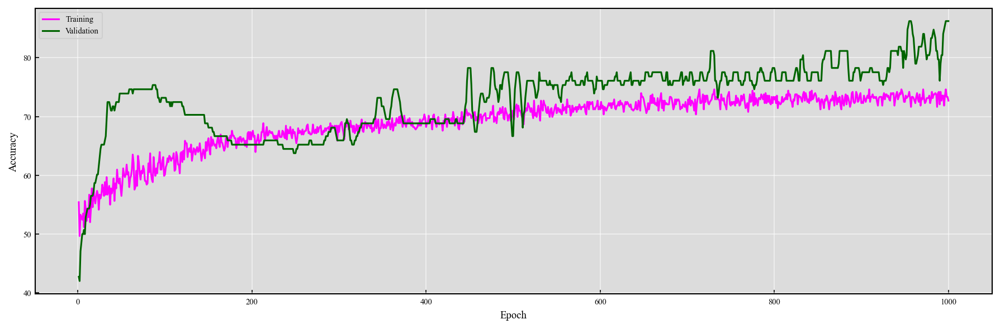

In [39]:
fig, ax = plt.subplots(figsize=(12,4))

ax.set_facecolor('gainsboro')
# Set boarder colour 
for spine in ax.spines:
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.grid(color='white', axis='x', linestyle='-', linewidth=1, alpha=0.5)
ax.grid(color='white', axis='y', linestyle='-', linewidth=1, alpha=0.5)

epochs_train = len(train_accuracy_list)
epochs_val = len(test_accuracy_list)

plt.plot(np.arange(1, epochs_train+1),train_accuracy_list, label='Training',color='magenta')
plt.plot(np.arange(1, epochs_val+1),test_accuracy_list, label='Validation',color='darkgreen')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show

In [40]:
# Plot training and validation losses 

# Use to plots to clean up the presentation 
from tueplots import bundles 
from tueplots import figsizes
from tueplots import axes

# tueplots paramaters 
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(axes.lines())
figsizes.neurips2021(nrows=3)["figure.figsize"]

plt.rcParams.update({"figure.dpi": 150})

fig, ax = plt.subplots(figsize=(12,4))

ax.set_facecolor('gainsboro')
# Set boarder colour 
for spine in ax.spines:
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.grid(color='white', axis='x', linestyle='-', linewidth=1, alpha=0.5)
ax.grid(color='white', axis='y', linestyle='-', linewidth=1, alpha=0.5)

ax.plot(train_loss_list[:-1], label='Training loss',color='magenta')
ax.plot(test_loss_list[:-1], label='Validation loss',color = 'darkgreen')

ax.set_title(' Training and validation loss ')

ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')

ax.legend()


plt.show



<function matplotlib.pyplot.show(close=None, block=None)>

FileNotFoundError: missing font metrics file: ptmr7t

<Figure size 1800x600 with 1 Axes>